# **Sciplex + L1000 Hyperparameter search**

In this notebook I run the hyperparameter search for the downstream analysis of treatment differences in the synovium.
We use untreated single cell data from [1] and paired bulk untreated and treated (16weeks) from [2] to infer the cell-type specific treatment effect.

1. Zhang, F. et al. Deconstruction of rheumatoid arthritis synovium defines inflammatory subtypes. Nature 623, 616–624 (2023).
DOI:10.1038/s41586-023-06708-y

2. Rivellese, F. et al. Rituximab versus tocilizumab in rheumatoid arthritis: synovial biopsy-based biomarker analysis of the phase 4 R4RA randomized trial. Nat. Med. 28, 1256–1268 (2022).


# **Imports**

In [1]:
# import the VAE code
import sys
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc
import scipy


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/davidnat/

In [2]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_sciplex_data/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_sciplex/"

cibersort_genes_path = (f"{os.getcwd()}/../data/single_cell_data/cibersort_sciplex/" +
                        "CIBERSORTx_Job67_test_cybersort_sig_inferred_phenoclasses" +
                        ".CIBERSORTx_Job67_test_cybersort_sig_inferred_refsample.bm.K999.txt")


cibersort_path = f"{os.getcwd()}/../data/single_cell_data/cibersort_sciplex/"



num_genes = 7000

exp_id = "all-sciplex"
res_id = "mono-sciplex"
curr_treatment = "mono"

RETRAIN_MODELS = False
RUN_CIBERSORT_GENES = False
RUN_CIBERSORT_SAMPLES = False


# Set-up experimental variables

In [3]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 3

# number of patients/domains/samples expected
n_tot_samples = 2 # 

# number of drugs 
# one-hot encoded
n_drugs = 6

# number of types of sequencing (one-hot encoded)
n_tech = 2


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [4]:
# get the info for CIBERSORT for generating the union_genes


if RUN_CIBERSORT_GENES:
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, "Tanespimycin (17-AAG)_MCF7", "CTRL", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    # now we transpose
    pseudobulks_sparse = scipy.sparse.csr_matrix(pseudobulks_df.values)
    pseudobulks_sparse_t = pseudobulks_sparse.transpose()
    pseudobulks_df = pd.DataFrame.sparse.from_spmatrix(pseudobulks_sparse_t)
    pseudobulks_df.columns = range(pseudobulks_df.shape[1])

    # now write it out
    #sc_preprocess.write_cs_bp_files(cibersort_path, exp_id, sig_df, pseudobulks_df)
    sig_samp_df = sig_df

    sig_df_vals = sig_samp_df.iloc[:,1:]
    sig_df_celltype = sig_samp_df.scpred_CellType

    print("1")

    # now we transpose
    sig_sparse = scipy.sparse.csr_matrix(sig_df_vals.values)
    sig_sparse_t = sig_sparse.transpose()
    sig_sparse = pd.DataFrame.sparse.from_spmatrix(sig_sparse_t)
    sig_sparse.columns = sig_df_celltype
    sig_sparse.index = sig_samp_df.columns[1:]
    print("2")

    sig_sparse = pd.DataFrame(sig_sparse)
    sig_sparse = sig_sparse.sample(1000, axis=1)

    print("3")

    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_sig.tsv.gz")
    sig_out_path = Path(sig_out_file)
    sig_sparse = sig_sparse.astype('int')
    sig_sparse.to_csv(sig_out_path, sep='\t',header=True)
    print("4")

    # write out the bulk RNA-seq mixture matrix
    sig_out_file = os.path.join(cibersort_path, f"test_cybersort_mix.tsv.gz")
    sig_out_path = Path(sig_out_file)

    pseudobulks_df.to_csv(sig_out_path, sep='\t',header=True)


In [25]:


# read in all the data

stim_order = ['CTRL', "STIM"]
cell_order = ['MCF7', "K562", "A549"]
drug_order = ["Fedratinib (SAR302503, TG101348)", "Tanespimycin (17-AAG)",
              "Trametinib (GSK1120212)", "Triamcinolone Acetonide", "Trichostatin A (TSA)"]

X_full = None
Y_full = None
meta_df = None
for curr_stim in stim_order:
    for curr_drug in drug_order:
        for curr_cell_type in cell_order:

            curr_samp = f"{curr_drug}_{curr_cell_type}"

            print(curr_samp)

            pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, curr_stim, "Train", exp_id)
            pseudobulks_df.columns = gene_df

            # now to simulate the single cell pseudobulks + "real" bulks
            # we need to take 50% of the CTRL pseudobulks and make them sc_ref
            if curr_stim == "CTRL":
                rand_idx = np.random.choice(metadata_df.index, int(metadata_df.shape[0]/2))
                metadata_df.samp_type.iloc[rand_idx] = "sc_ref"
                metadata_df.perturbation = "control"

            # we need more than 1 sample, so just make it random and we wont put any weight in it
            rand_idx = np.random.choice(metadata_df.index, int(metadata_df.shape[0]/2))
            metadata_df.sample_id.iloc[rand_idx] = "samp2"

            if X_full is None:
                X_full, Y_full, meta_df = pseudobulks_df, prop_df, metadata_df
            else:
                X_full = pd.concat([X_full, pseudobulks_df])
                Y_full = pd.concat([Y_full, prop_df])
                meta_df = pd.concat([meta_df, metadata_df])

X_full.columns = gene_df


Fedratinib (SAR302503, TG101348)_MCF7
Fedratinib (SAR302503, TG101348)_K562
Fedratinib (SAR302503, TG101348)_A549
Tanespimycin (17-AAG)_MCF7
Tanespimycin (17-AAG)_K562
Tanespimycin (17-AAG)_A549
Trametinib (GSK1120212)_MCF7
Trametinib (GSK1120212)_K562
Trametinib (GSK1120212)_A549
Triamcinolone Acetonide_MCF7
Triamcinolone Acetonide_K562
Triamcinolone Acetonide_A549
Trichostatin A (TSA)_MCF7
Trichostatin A (TSA)_K562
Trichostatin A (TSA)_A549
Fedratinib (SAR302503, TG101348)_MCF7
Fedratinib (SAR302503, TG101348)_K562
Fedratinib (SAR302503, TG101348)_A549
Tanespimycin (17-AAG)_MCF7
Tanespimycin (17-AAG)_K562
Tanespimycin (17-AAG)_A549
Trametinib (GSK1120212)_MCF7
Trametinib (GSK1120212)_K562
Trametinib (GSK1120212)_A549
Triamcinolone Acetonide_MCF7
Triamcinolone Acetonide_K562
Triamcinolone Acetonide_A549
Trichostatin A (TSA)_MCF7
Trichostatin A (TSA)_K562
Trichostatin A (TSA)_A549


In [26]:
Y_full

,A549,K562,MCF7
0,0.96,0.02,0.02
0,0.26,0.72,0.02
0,0.18,0.78,0.04
0,0.12,0.84,0.04
0,0.80,0.08,0.12
...,...,...,...
0,0.12,0.82,0.06
0,0.04,0.94,0.02
0,0.12,0.12,0.76
0,0.92,0.06,0.02


In [27]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,perturbation,cell_type_perturbed
0,samp1,CTRL,Train,random,bulk,control,MCF7
1,samp1,CTRL,Train,random,sc_ref,control,MCF7
2,samp1,CTRL,Train,random,bulk,control,MCF7
3,samp1,CTRL,Train,random,sc_ref,control,MCF7
4,samp1,CTRL,Train,random,bulk,control,MCF7
...,...,...,...,...,...,...,...
995,samp1,STIM,Train,random,bulk,Trichostatin A (TSA),A549
996,samp1,STIM,Train,random,bulk,Trichostatin A (TSA),A549
997,samp1,STIM,Train,random,bulk,Trichostatin A (TSA),A549
998,samp1,STIM,Train,random,bulk,Trichostatin A (TSA),A549


In [28]:
tab = meta_df.groupby(['samp_type', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
samp_type,,
bulk,9108.0,15000.0
sc_ref,5892.0,NaN


In [29]:
tab = meta_df.groupby(['samp_type', 'perturbation']).size()
tab.unstack()

perturbation,"Fedratinib (SAR302503, TG101348)",Tanespimycin (17-AAG),Trametinib (GSK1120212),Triamcinolone Acetonide,Trichostatin A (TSA),control
samp_type,,,,,,
bulk,3000.0,3000.0,3000.0,3000.0,3000.0,9108.0
sc_ref,NaN,NaN,NaN,NaN,NaN,5892.0


In [30]:
tab = meta_df.groupby(['samp_type', 'cell_type_perturbed']).size()
tab.unstack()

cell_type_perturbed,A549,K562,MCF7
samp_type,,,
bulk,8047,8024,8037
sc_ref,1953,1976,1963


# Define indices and set-up metadata

In [11]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.perturbation)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim != "CTRL")[0]
idx_random = np.where(meta_df.cell_prop_type == "random")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(gene_df, cibersort_genes)

# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()


## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))

# need to get the genes such that
# the union of the highly variable and the
# CIBERSORTx genes are 7000 total
num_genes_found = False
initial_count = 7000
while not num_genes_found:
    idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:]
    top_gene_df = gene_df.iloc[idx_top]
    CoV_only = np.union1d(top_gene_df, cibersort_genes)
    if len(CoV_only) == 7000:
        num_genes_found = True
    else:
        initial_count = initial_count -1

idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:] 
gene_df = gene_df.iloc[idx_top]



# Make sure our test/train indicies are correct

Show some stats on the samples

In [12]:
X_train.shape

(30000, 30517)

In [13]:
tab = meta_df.groupby(['isTraining', 'samp_type']).size()
tab.unstack()

samp_type,bulk,sc_ref
isTraining,,
Train,24064,5936


In [14]:
tab = meta_df.iloc[idx_train].groupby(['isTraining', 'stim']).size()
tab.unstack()

stim,CTRL,STIM
isTraining,,
Train,15000,15000


# compare our variable genes with cibersort defined genes

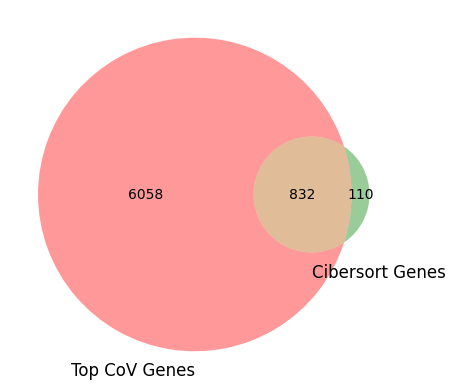

In [15]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [16]:
union_genes = np.union1d(gene_df, cibersort_genes)
len(union_genes)

7000

# Normalize data

In [17]:

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = scaler.transform(X_full)

# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
bulk_unkp = bulk_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
bulk_kp = bulk_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()


# Plot all data

In [18]:
Y_full

,A549,K562,MCF7
0,0.96,0.02,0.02
0,0.26,0.72,0.02
0,0.18,0.78,0.04
0,0.12,0.84,0.04
0,0.80,0.08,0.12
...,...,...,...
0,0.12,0.82,0.06
0,0.04,0.94,0.02
0,0.12,0.12,0.76
0,0.92,0.06,0.02


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.008s...
[t-SNE] Computed neighbors for 1000 samples in 0.776s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 4.310229
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.997620
[t-SNE] KL divergence after 500 iterations: 1.217817
(1000, 2)
(1000, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_5665/524547721.py:24: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


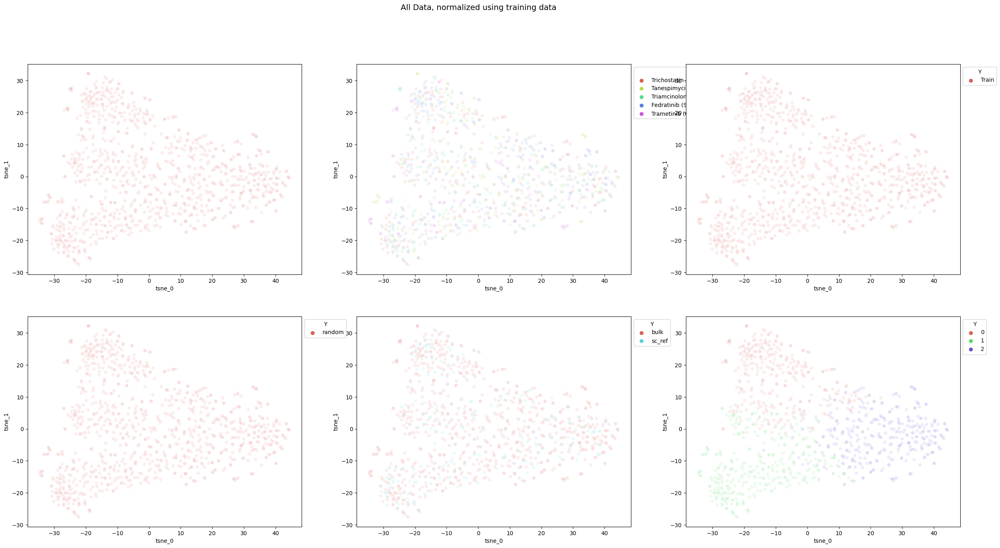

In [21]:
## plot samples
idx_tmp = np.random.choice(range(X_full.shape[0]), 1000, replace=True)


plot_df = vp.get_tsne_for_plotting(X_full[idx_tmp,])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_tmp])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].perturbation.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


(24064, 2)
(24064, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_5665/91752917.py:23: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


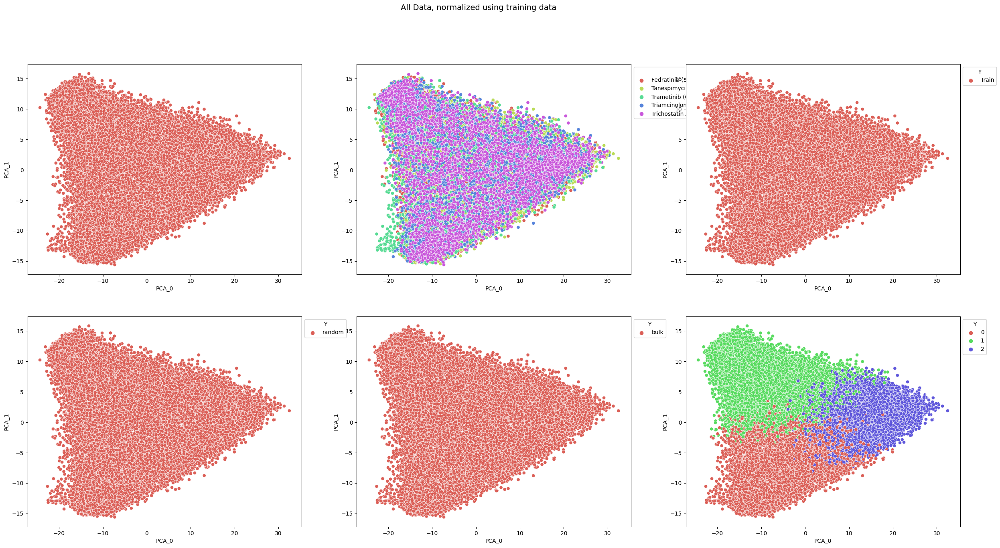

In [22]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.perturbation.to_numpy()[idx_interest], axs[0,1], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"", alpha=1)
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"", alpha=1)
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"", alpha=1)


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.007s...
[t-SNE] Computed neighbors for 1000 samples in 0.461s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 4.468963
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.020157
[t-SNE] KL divergence after 500 iterations: 1.143844
(1000, 2)
(1000, 2)


/var/folders/64/dljh4z4j4vq9yn4f7wkb2k1h0000gp/T/ipykernel_5665/2954255666.py:24: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


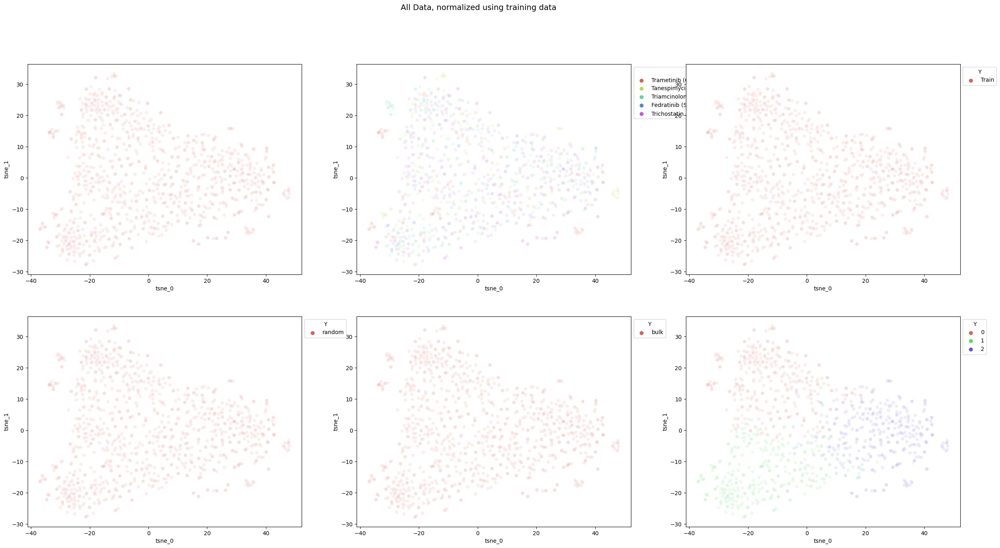

In [24]:
## plot samples
idx_interest = np.where(np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train"))[0]
idx_interest = np.random.choice(idx_interest, 1000, replace=True)

plot_df = vp.get_tsne_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.perturbation.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Run BuDDI**

## Hyperparameter Search

We are going to search over 2 parameters: 

1.  the weighting of the loss for the latent space classifications against the reconstruction (100, 1000, 10000)
2.  the number of epochs  (50, 100, 200)

2024-03-19 15:33:00.218725: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:375] MLIR V1 optimization pass is not enabled
2024-03-19 15:33:00.250368: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_h2/kernel/Assign' id:343 op device:{requested: '', assigned: ''} def:{{{node cls_h2/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](cls_h2/kernel, cls_h2/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:33:00.513149: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack/truediv/y' id:387 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by

test_size_samp: 500
train_size_samp: 14500


2024-03-19 15:33:01.931820: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/cls_h1/kernel/v/Assign' id:2425 op device:{requested: '', assigned: ''} def:{{{node training/Adam/cls_h1/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/cls_h1/kernel/v, training/Adam/cls_h1/kernel/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:33:03.076674: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_1/AddN' id:1183 op device:{requested: '', assigned: ''} def:{{{node loss_1/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_1/mul, loss_1/mul_1, loss_1/mul_2, loss_1/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger a

Elapsed:  749.1067790985107
Epoch:  49
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_100_rittoc-synovium_classifier/assets


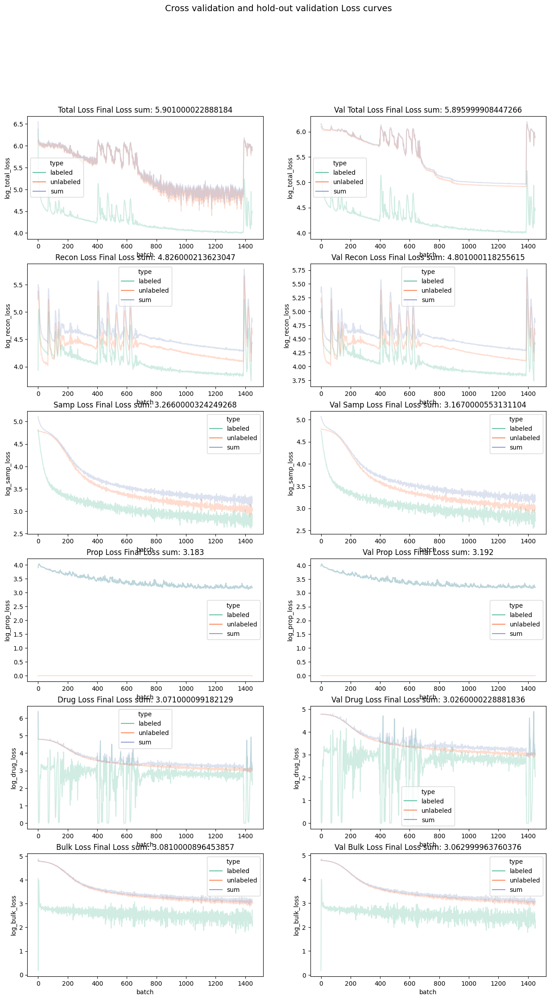

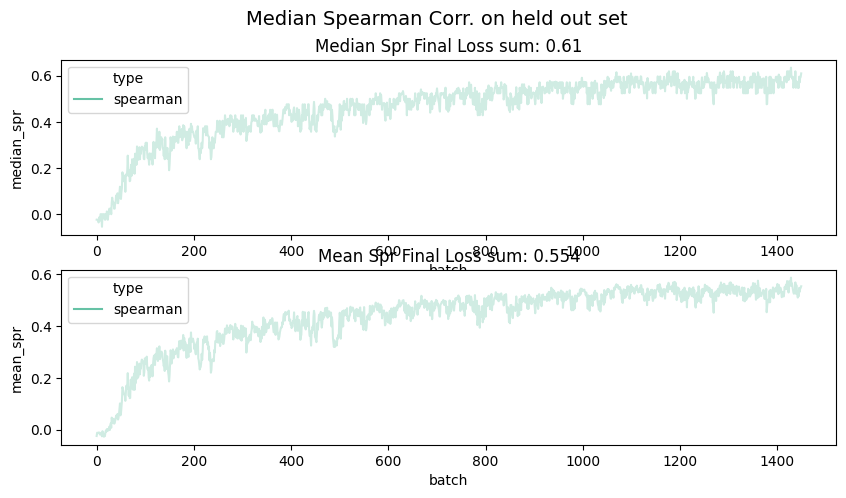

In [ ]:
curr_n_epoch=50
curr_wt = 100


params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)



### 50 1000

2024-03-19 15:45:39.546073: W tensorflow/c/c_api.cc:304] Operation '{name:'sigma_bulk_1/kernel/Assign' id:5222 op device:{requested: '', assigned: ''} def:{{{node sigma_bulk_1/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](sigma_bulk_1/kernel, sigma_bulk_1/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:45:39.815473: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_1/truediv/y' id:5313 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_1/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger a

test_size_samp: 500
train_size_samp: 14500


2024-03-19 15:45:41.544155: W tensorflow/c/c_api.cc:304] Operation '{name:'training_4/Adam/cls_h2_1/bias/m/Assign' id:7105 op device:{requested: '', assigned: ''} def:{{{node training_4/Adam/cls_h2_1/bias/m/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_4/Adam/cls_h2_1/bias/m, training_4/Adam/cls_h2_1/bias/m/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:45:42.715785: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_3/AddN' id:6109 op device:{requested: '', assigned: ''} def:{{{node loss_3/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_3/mul, loss_3/mul_1, loss_3/mul_2, loss_3/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will t

Elapsed:  722.8230152130127
Epoch:  49
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_1000_rittoc-synovium_classifier/assets


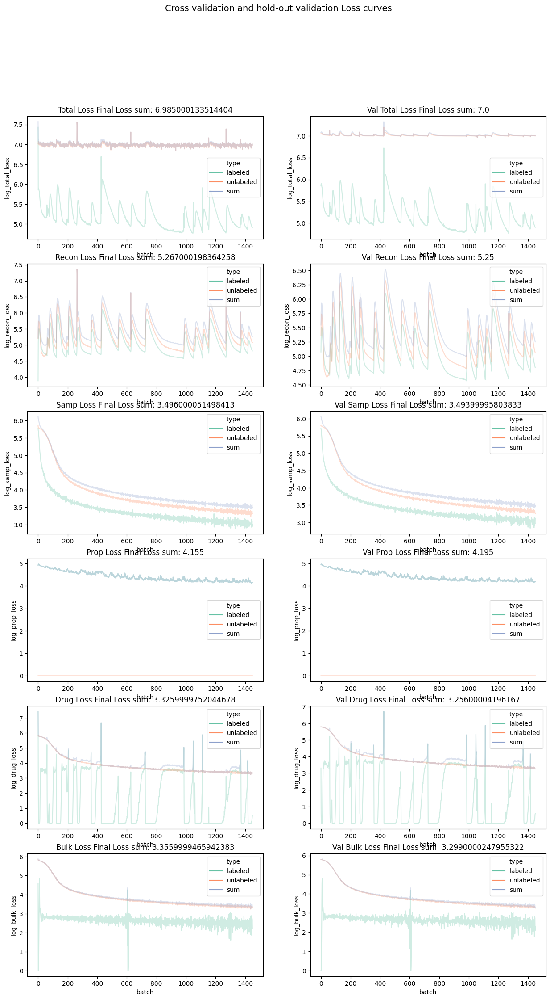

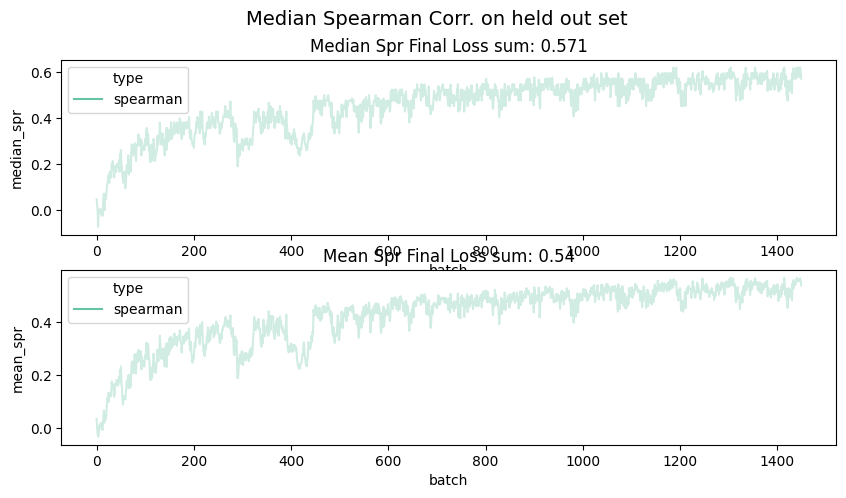

In [ ]:
curr_n_epoch=50
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


### 50 10000

2024-03-19 15:57:53.066117: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_h1_2/kernel/Assign' id:10134 op device:{requested: '', assigned: ''} def:{{{node cls_h1_2/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](cls_h1_2/kernel, cls_h1_2/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:57:53.397068: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_2/truediv/y' id:10202 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_2/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the

test_size_samp: 500
train_size_samp: 14500


2024-03-19 15:57:55.635934: W tensorflow/c/c_api.cc:304] Operation '{name:'training_8/Adam/decoder_h1_6/bias/v/Assign' id:12220 op device:{requested: '', assigned: ''} def:{{{node training_8/Adam/decoder_h1_6/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_8/Adam/decoder_h1_6/bias/v, training_8/Adam/decoder_h1_6/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 15:57:57.190486: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_5/AddN' id:10998 op device:{requested: '', assigned: ''} def:{{{node loss_5/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_5/mul, loss_5/mul_1, loss_5/mul_2, loss_5/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no 

Elapsed:  722.3180868625641
Epoch:  49
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//50_10000_rittoc-synovium_classifier/assets


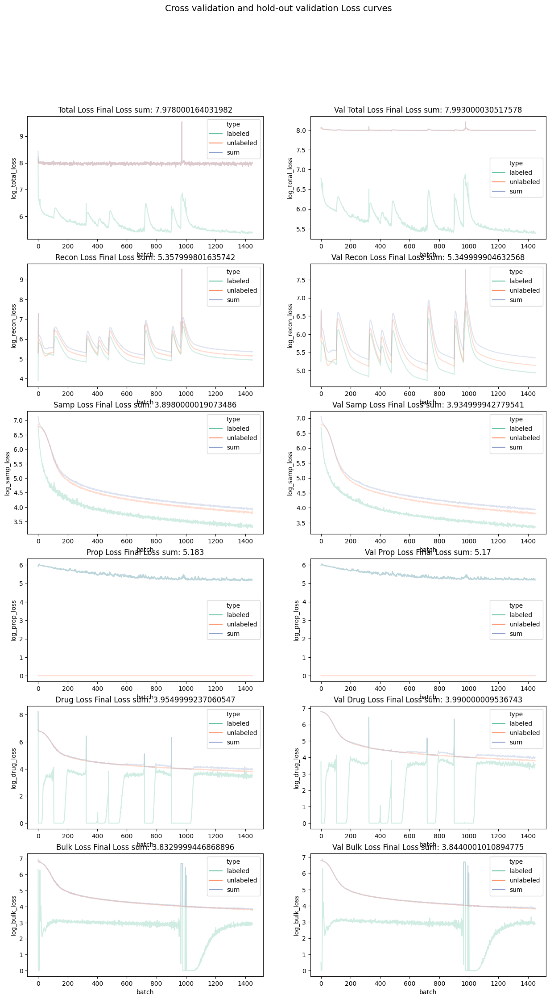

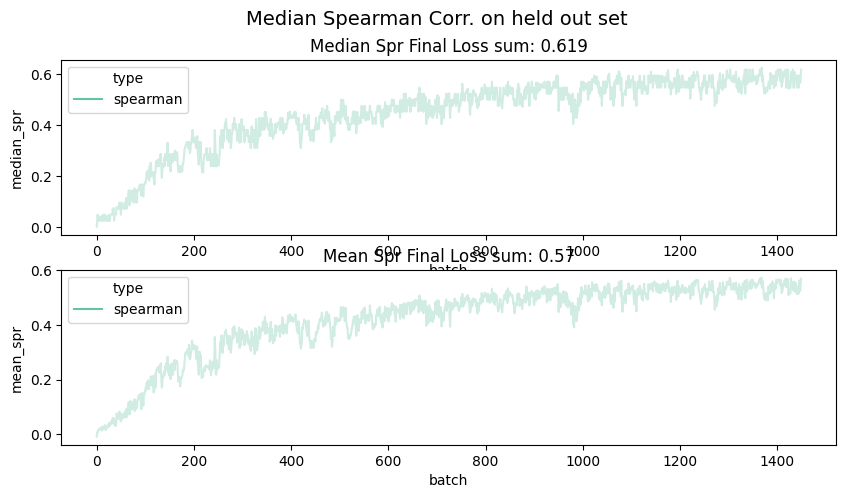

In [ ]:
curr_n_epoch=50
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 100

2024-03-19 16:10:06.987774: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_drug_3/kernel/Assign' id:14791 op device:{requested: '', assigned: ''} def:{{{node encoder_drug_3/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_drug_3/kernel, encoder_drug_3/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:10:07.390516: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_3/truediv/y' id:15091 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_3/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will

test_size_samp: 500
train_size_samp: 14500


2024-03-19 16:10:09.984669: W tensorflow/c/c_api.cc:304] Operation '{name:'count_31/Assign' id:15380 op device:{requested: '', assigned: ''} def:{{{node count_31/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](count_31, count_31/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:10:11.995776: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_7/AddN' id:15887 op device:{requested: '', assigned: ''} def:{{{node loss_7/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_7/mul, loss_7/mul_1, loss_7/mul_2, loss_7/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a ne

Elapsed:  1440.9838771820068
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_100_rittoc-synovium_classifier/assets


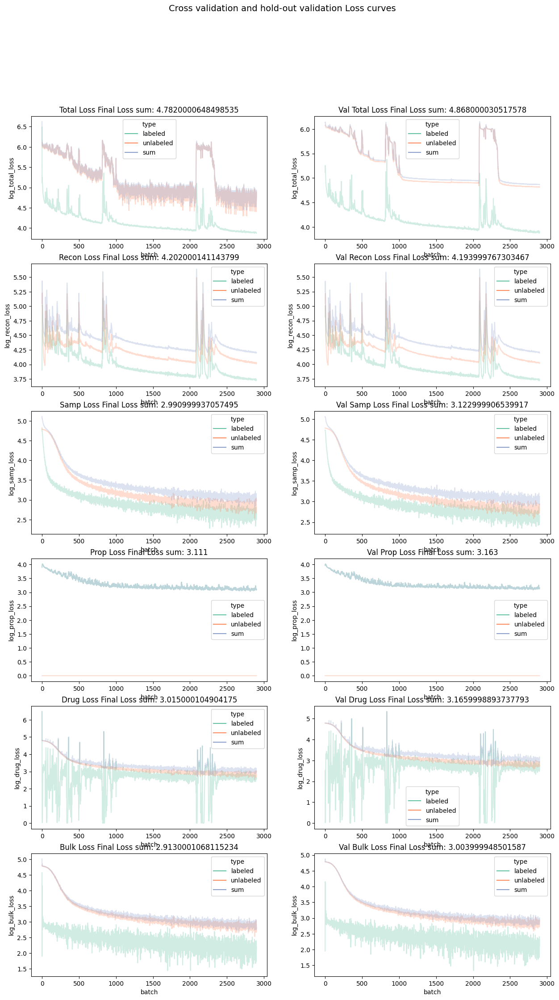

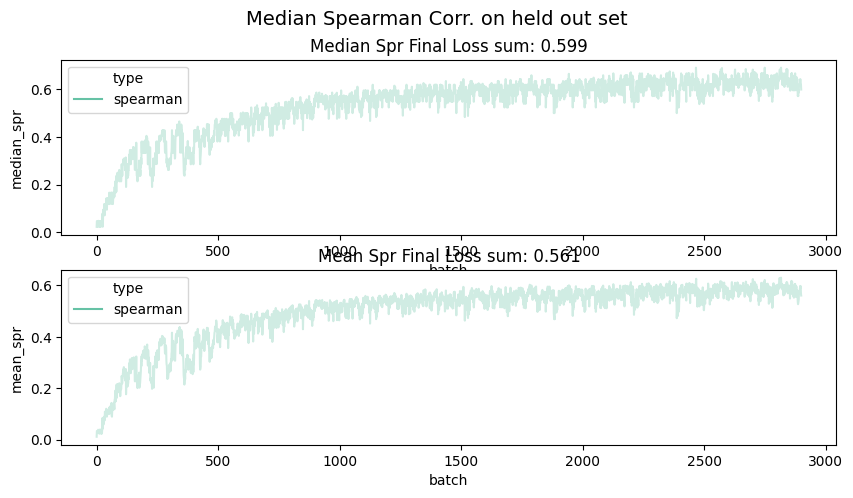

In [ ]:
curr_n_epoch=100
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 100 1000

2024-03-19 16:34:21.413403: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_slack_4/bias/Assign' id:19637 op device:{requested: '', assigned: ''} def:{{{node encoder_slack_4/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_slack_4/bias, encoder_slack_4/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:34:21.883650: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_4/truediv/y' id:19980 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_4/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in th

test_size_samp: 500
train_size_samp: 14500


2024-03-19 16:34:24.799559: W tensorflow/c/c_api.cc:304] Operation '{name:'training_16/Adam/encoder_slack_4/bias/v/Assign' id:21842 op device:{requested: '', assigned: ''} def:{{{node training_16/Adam/encoder_slack_4/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_16/Adam/encoder_slack_4/bias/v, training_16/Adam/encoder_slack_4/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:34:27.190071: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_9/AddN' id:20776 op device:{requested: '', assigned: ''} def:{{{node loss_9/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_9/mul, loss_9/mul_1, loss_9/mul_2, loss_9/mul_3)}}' was changed by setting attribute after it was run by a session. This mutati

Elapsed:  1446.109465122223
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_1000_rittoc-synovium_classifier/assets


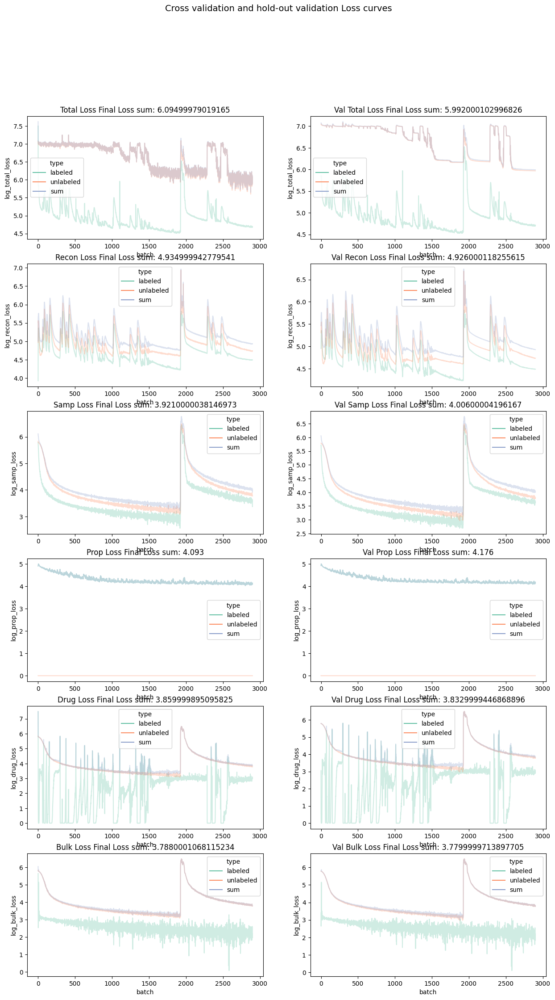

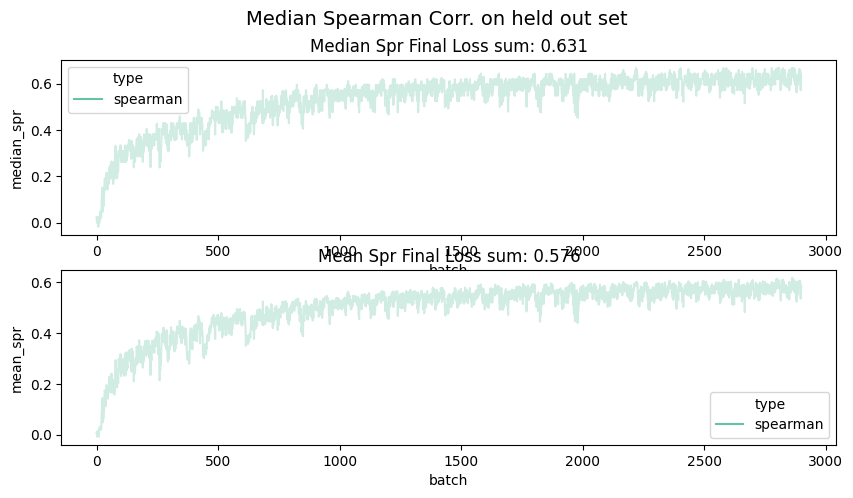

In [ ]:
curr_n_epoch=100
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

fig.tight_layout()


### 100 10000

2024-03-19 16:58:41.660751: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_slack_5/kernel/Assign' id:24521 op device:{requested: '', assigned: ''} def:{{{node encoder_slack_5/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_slack_5/kernel, encoder_slack_5/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:58:42.207004: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_5/truediv/y' id:24869 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_5/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and 

test_size_samp: 500
train_size_samp: 14500


2024-03-19 16:58:45.585066: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_h1_15/bias/Assign' id:24974 op device:{requested: '', assigned: ''} def:{{{node decoder_h1_15/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](decoder_h1_15/bias, decoder_h1_15/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 16:58:48.554481: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_11/AddN' id:25665 op device:{requested: '', assigned: ''} def:{{{node loss_11/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_11/mul, loss_11/mul_1, loss_11/mul_2, loss_11/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't 

Elapsed:  1484.8230237960815
Epoch:  99
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//100_10000_rittoc-synovium_classifier/assets


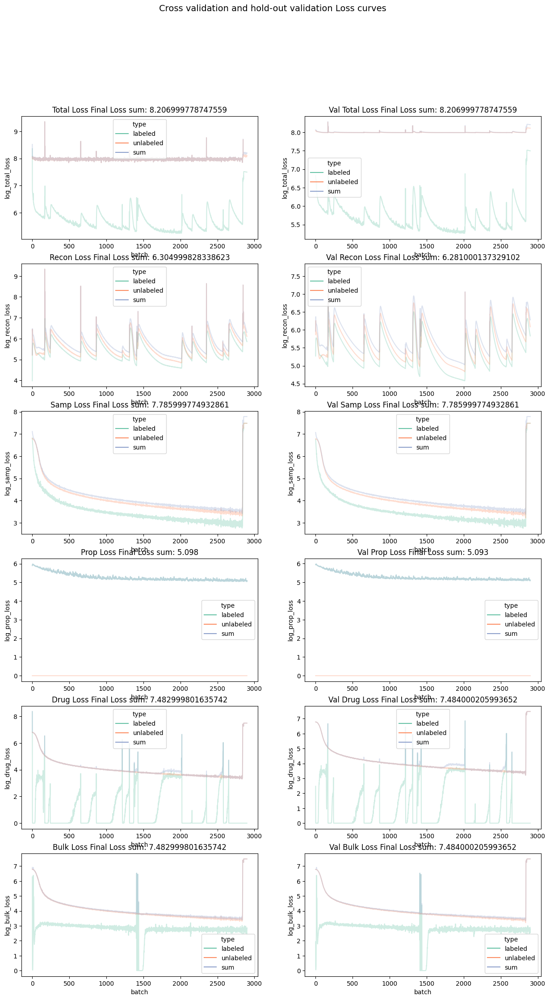

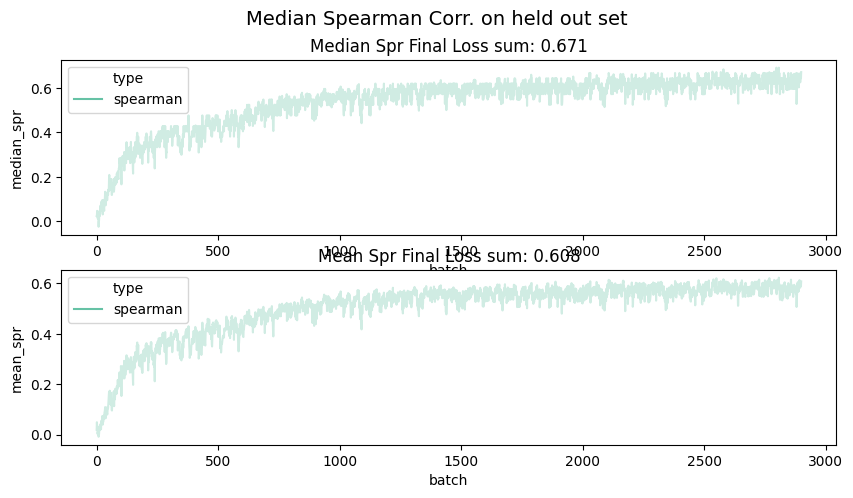

In [ ]:
curr_n_epoch=100
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 100

2024-08-23 16:53:23.791501: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_h2_1/kernel/Assign' id:5245 op device:{requested: '', assigned: ''} def:{{{node cls_h2_1/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](cls_h2_1/kernel, cls_h2_1/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-23 16:53:23.922809: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_1/truediv/y' id:5289 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_1/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the f

test_size_samp: 500
train_size_samp: 2000


2024-08-23 16:53:25.255474: W tensorflow/c/c_api.cc:304] Operation '{name:'training_4/Adam/decoder_out_3/bias/v/Assign' id:7353 op device:{requested: '', assigned: ''} def:{{{node training_4/Adam/decoder_out_3/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_4/Adam/decoder_out_3/bias/v, training_4/Adam/decoder_out_3/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-23 16:53:26.261408: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_3/AddN' id:6083 op device:{requested: '', assigned: ''} def:{{{node loss_3/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_3/mul, loss_3/mul_1, loss_3/mul_2, loss_3/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have n

Elapsed:  125.43762683868408
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//200_100_trichostatin-sciplex_classifier/assets


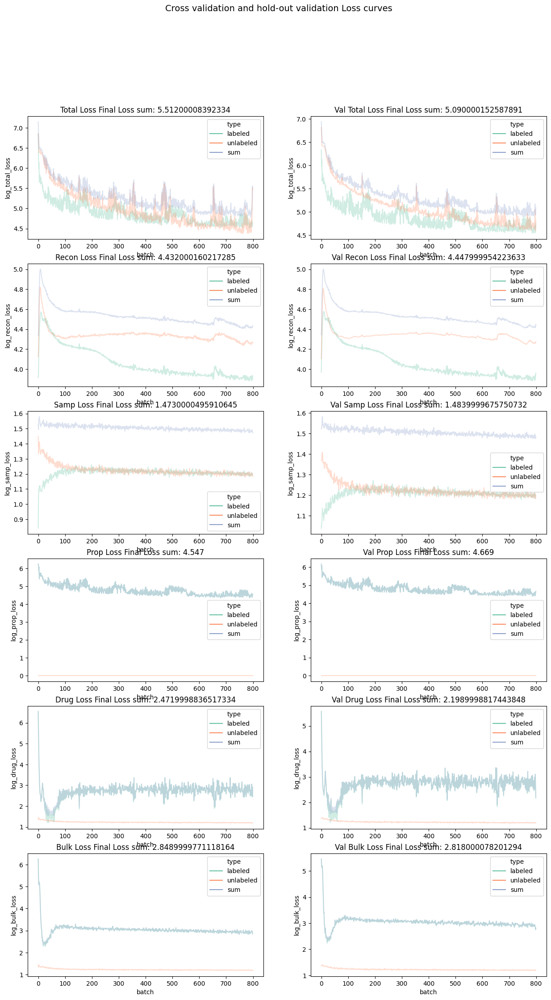

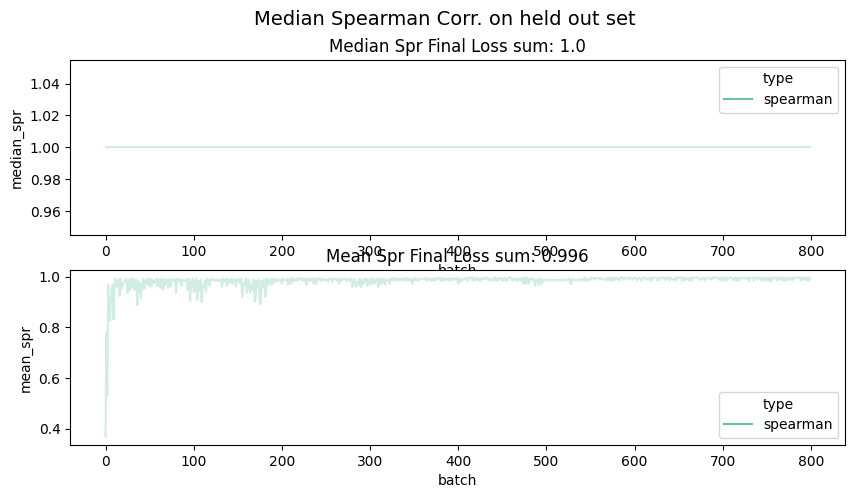

In [461]:
curr_n_epoch=200
curr_wt = 100
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*0.1, alpha_prop=curr_wt*100, 
            alpha_bulk=curr_wt*100, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 1000

2024-03-19 18:14:16.155796: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_slack_7/bias/Assign' id:34304 op device:{requested: '', assigned: ''} def:{{{node encoder_slack_7/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_slack_7/bias, encoder_slack_7/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 18:14:16.895465: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_7/truediv/y' id:34647 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_7/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in th

test_size_samp: 500
train_size_samp: 14500


2024-03-19 18:14:23.572121: W tensorflow/c/c_api.cc:304] Operation '{name:'total_67/Assign' id:34931 op device:{requested: '', assigned: ''} def:{{{node total_67/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](total_67, total_67/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 18:14:27.794191: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_15/AddN' id:35443 op device:{requested: '', assigned: ''} def:{{{node loss_15/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_15/mul, loss_15/mul_1, loss_15/mul_2, loss_15/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or creat

Elapsed:  2910.3550951480865
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_1000_rittoc-synovium_classifier/assets


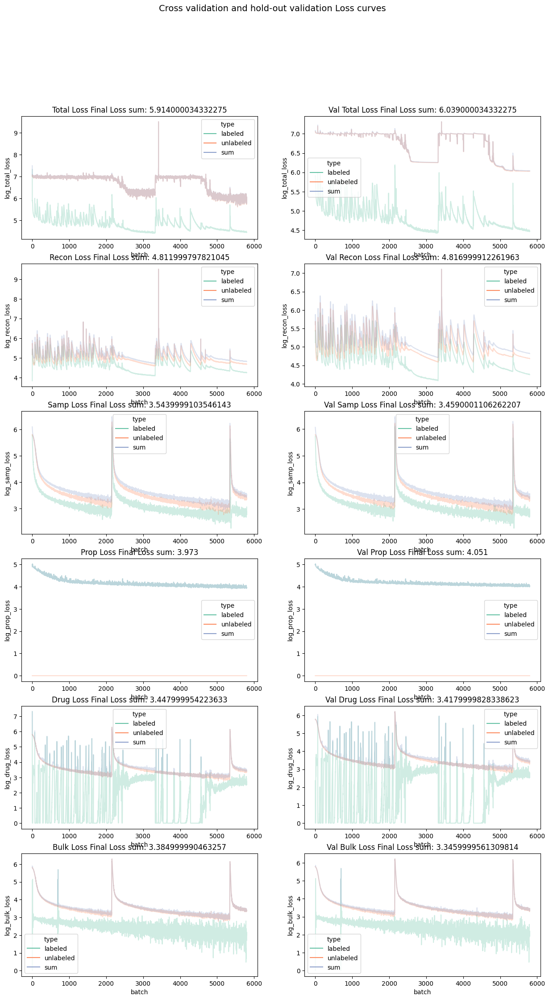

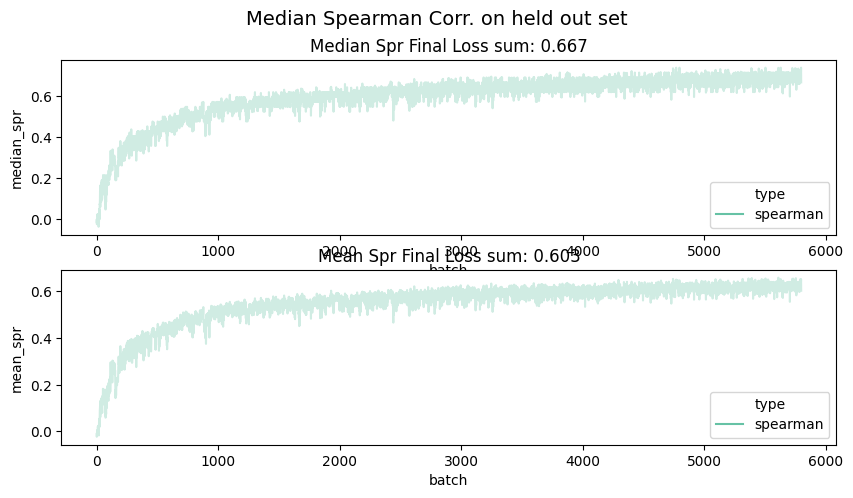

In [ ]:
curr_n_epoch=200
curr_wt = 1000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

### 200 10000

2024-03-19 19:03:06.354923: W tensorflow/c/c_api.cc:304] Operation '{name:'encoder_drug_8/kernel/Assign' id:39236 op device:{requested: '', assigned: ''} def:{{{node encoder_drug_8/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](encoder_drug_8/kernel, encoder_drug_8/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 19:03:07.142127: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_8/truediv/y' id:39536 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_8/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will

test_size_samp: 500
train_size_samp: 14500


2024-03-19 19:03:12.748900: W tensorflow/c/c_api.cc:304] Operation '{name:'training_32/Adam/sigma_drug_8/kernel/v/Assign' id:41465 op device:{requested: '', assigned: ''} def:{{{node training_32/Adam/sigma_drug_8/kernel/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_32/Adam/sigma_drug_8/kernel/v, training_32/Adam/sigma_drug_8/kernel/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-03-19 19:03:17.791223: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_17/AddN' id:40332 op device:{requested: '', assigned: ''} def:{{{node loss_17/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_17/mul, loss_17/mul_1, loss_17/mul_2, loss_17/mul_3)}}' was changed by setting attribute after it was run by a session. This muta

Elapsed:  2900.837380886078
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium//200_10000_rittoc-synovium_classifier/assets


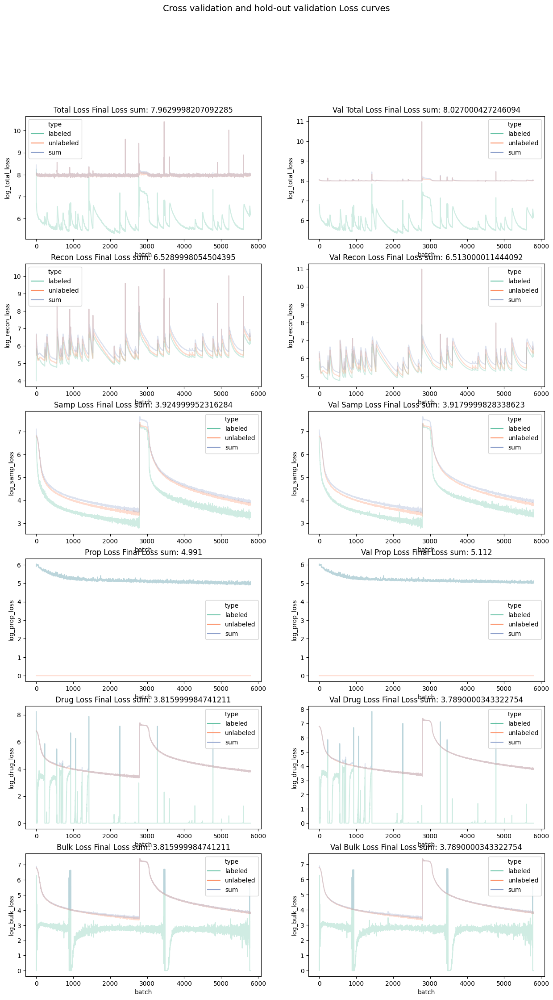

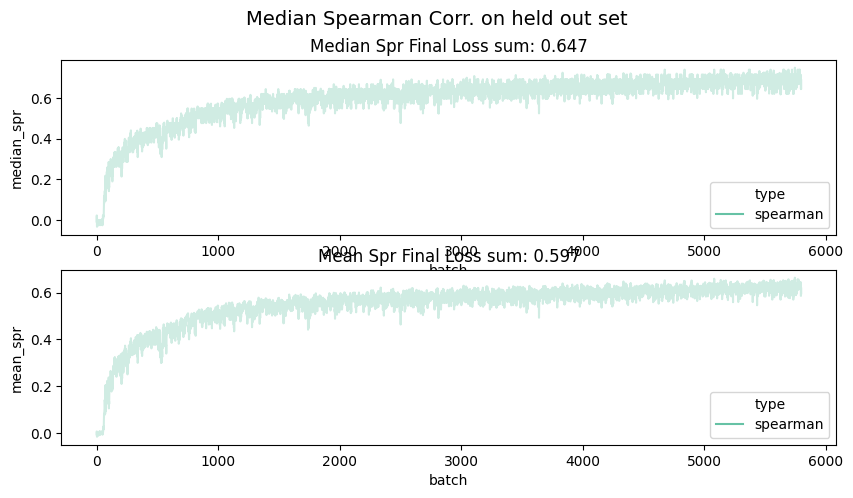

In [ ]:
curr_n_epoch=200
curr_wt = 10000
params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt*100, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt, alpha_drug=curr_wt*100)

curr_res_id = f"{curr_n_epoch}_{curr_wt}_{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
            n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

In [ ]:
res

BuddiTrainResults(known_prop_vae=<keras.src.engine.functional.Functional object at 0x36571f0d0>, unknown_prop_vae=<keras.src.engine.functional.Functional object at 0x57d9c56f0>, encoder_unlab=<keras.src.engine.functional.Functional object at 0x28dec3e50>, encoder_lab=<keras.src.engine.functional.Functional object at 0x28dd98670>, decoder=<keras.src.engine.functional.Functional object at 0x28df6af50>, classifier=<keras.src.engine.functional.Functional object at 0x36571e260>, loss_fig=<Figure size 1500x2500 with 12 Axes>, spr_fig=<Figure size 1000x500 with 2 Axes>, output_folder='/Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/synovium_analysis/../results/single_cell_data/buddiM2_synovium/')

# **Results**

Looking at all the results, we see that 200 epochs and weight of 100 gets the lowest reconstruction error and performs reasonably well in estimating the cell-type proportions.

**log10 reconstruction error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 4.8 | 4.19 | **4.04** |
| 1000 | 5.25 | 4.926 | 4.81 |
| 10000 | 5.35 | 6.28 | 6.51 |


**spearman error:**

| Weight | 50 epochs | 100 epochs | 200 epochs |
| :---: | :---: | :---: | :---: |
| 100 | 0.61 | 0.599 | **0.71** |
| 1000 | 0.571 | 0.631 | 0.667 |
| 10000 | 0.619 | 0.671 | 0.647 |


In [462]:


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/200_100_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/200_100_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/200_100_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/200_100_{res_id}_classifier")


2024-08-23 16:55:40.341087: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_43' id:10047 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_43}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_11, Identity_1251)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-23 16:55:41.161432: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_78' id:10452 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_78}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_19, Identity_1286)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-23 16:55:41.563343: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_86' id:10612 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_86}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_25, Identity_1294)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-23 16:55:41.985985: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_92' id:10701 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_92}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_28, Identity_1300)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 08:53:02.454722: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_h1_15/kernel/Assign' id:45855 op device:{requested: '', assigned: ''} def:{{{node cls_h1_15/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](cls_h1_15/kernel, cls_h1_15/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-26 08:53:03.753886: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_8/truediv/y' id:45923 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_8/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in

test_size_samp: 500
train_size_samp: 10000


2024-08-26 08:53:12.420745: W tensorflow/c/c_api.cc:304] Operation '{name:'bulk_h2_8/bias/Assign' id:46149 op device:{requested: '', assigned: ''} def:{{{node bulk_h2_8/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](bulk_h2_8/bias, bulk_h2_8/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-26 08:53:18.727295: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_17/AddN' id:46717 op device:{requested: '', assigned: ''} def:{{{node loss_17/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_17/mul, loss_17/mul_1, loss_17/mul_2, loss_17/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes aft

Elapsed:  621.8617842197418
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model1_trichostatin-sciplex_classifier/assets
2024-08-26 09:03:55.163248: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out_16/bias/Assign' id:50783 op device:{requested: '', assigned: ''} def:{{{node cls_out_16/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](cls_out_16/bias, cls_out_16/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-26 09:03:56.590079: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_9/truediv/y' id:50798 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_9/truediv/y}} = Const[_has_manual_control_depe

test_size_samp: 500
train_size_samp: 10000


2024-08-26 09:04:06.899400: W tensorflow/c/c_api.cc:304] Operation '{name:'training_36/Adam/learning_rate/Assign' id:52408 op device:{requested: '', assigned: ''} def:{{{node training_36/Adam/learning_rate/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_36/Adam/learning_rate, training_36/Adam/learning_rate/Initializer/initial_value)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-26 09:04:14.406840: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_19/AddN' id:51592 op device:{requested: '', assigned: ''} def:{{{node loss_19/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_19/mul, loss_19/mul_1, loss_19/mul_2, loss_19/mul_3)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect

Elapsed:  648.6835646629333
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model2_trichostatin-sciplex_classifier/assets
2024-08-26 09:15:13.727272: W tensorflow/c/c_api.cc:304] Operation '{name:'sigma_bulk_24/kernel/Assign' id:55582 op device:{requested: '', assigned: ''} def:{{{node sigma_bulk_24/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](sigma_bulk_24/kernel, sigma_bulk_24/kernel/Initializer/stateless_random_uniform)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-26 09:15:14.907058: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack_10/truediv/y' id:55673 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack_10/tru

test_size_samp: 500
train_size_samp: 10000


2024-08-26 09:15:24.549073: W tensorflow/c/c_api.cc:304] Operation '{name:'training_40/Adam/encoder_bulk_24/bias/v/Assign' id:57563 op device:{requested: '', assigned: ''} def:{{{node training_40/Adam/encoder_bulk_24/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training_40/Adam/encoder_bulk_24/bias/v, training_40/Adam/encoder_bulk_24/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-26 09:15:32.185099: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_21/AddN' id:56467 op device:{requested: '', assigned: ''} def:{{{node loss_21/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_21/mul, loss_21/mul_1, loss_21/mul_2, loss_21/mul_3)}}' was changed by setting attribute after it was run by a session. This 

Elapsed:  639.139600276947
Epoch:  199
INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_known_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_encoder_unlab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_encoder_lab/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_decoder/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_classifier/assets


INFO:tensorflow:Assets written to: /Users/davidnat/Documents/projects/greenelab/buddi_test/buddi_analysis/l1000_sciplex_analysis/../results/single_cell_data/buddiM2_sciplex//trichostatin_model3_trichostatin-sciplex_classifier/assets


2024-08-26 09:26:27.858999: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_619' id:60447 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_619}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_208, Identity_7263)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:31.062562: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_651' id:60846 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_651}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_224, Identity_7295)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:33.607276: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_655' id:60998 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_655}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_228, Identity_7299)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:36.208023: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_656' id:61077 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_656}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_229, Identity_7300)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:40.890946: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_672' id:61364 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_672}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_235, Identity_7316)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:44.019683: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_693' id:61741 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_693}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_255, Identity_7337)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:46.429620: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_711' id:61921 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_711}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_256, Identity_7355)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:48.979855: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_718' id:62012 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_718}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_260, Identity_7362)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:52.148528: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_735' id:62301 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_735}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_266, Identity_7379)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:55.370987: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_763' id:62692 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_763}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_280, Identity_7407)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:26:59.353764: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_770' id:62850 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_770}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_286, Identity_7414)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-08-26 09:27:02.236401: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_777' id:62941 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_777}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_289, Identity_7421)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


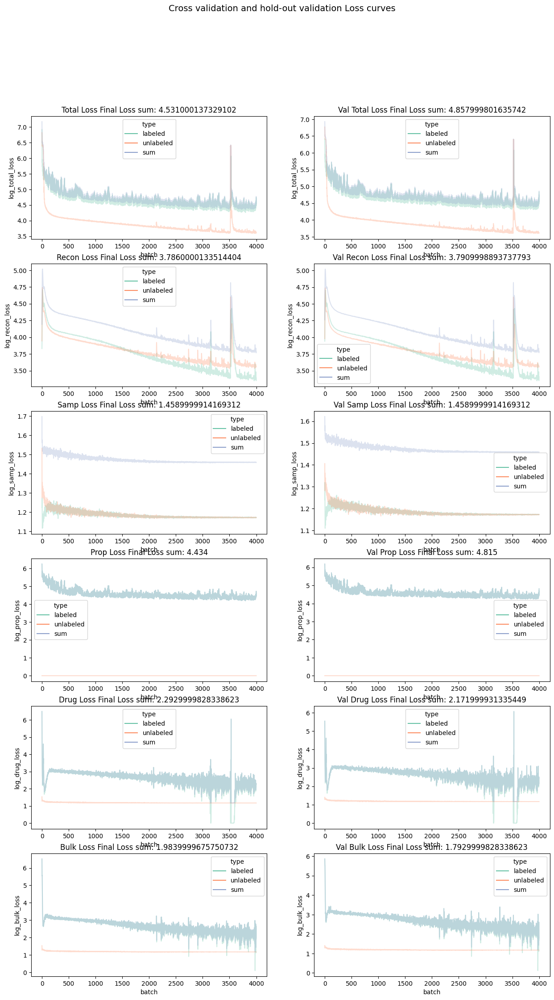

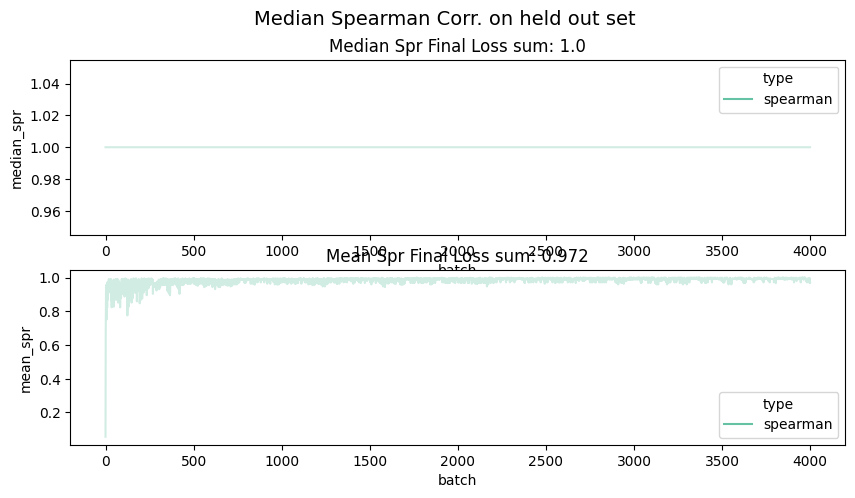

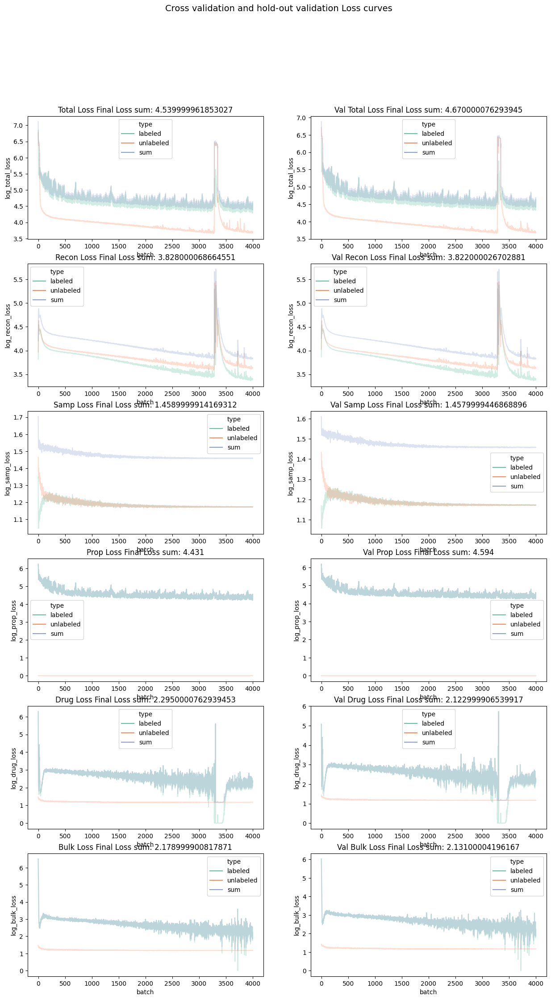

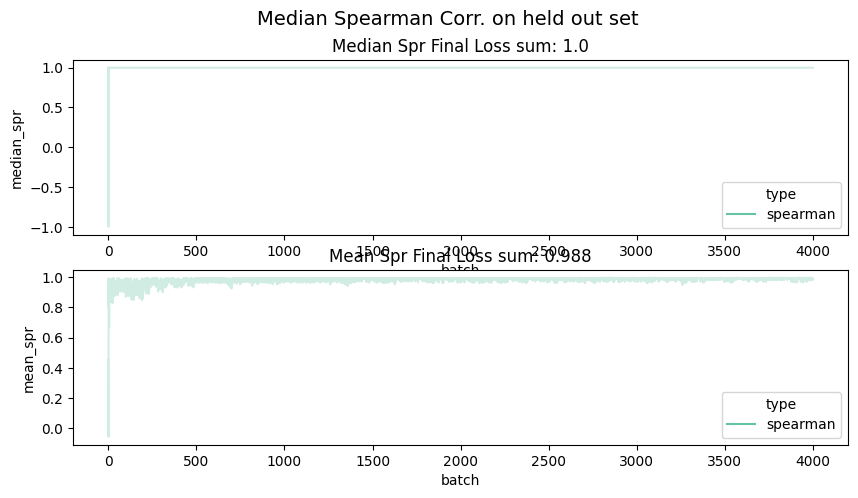

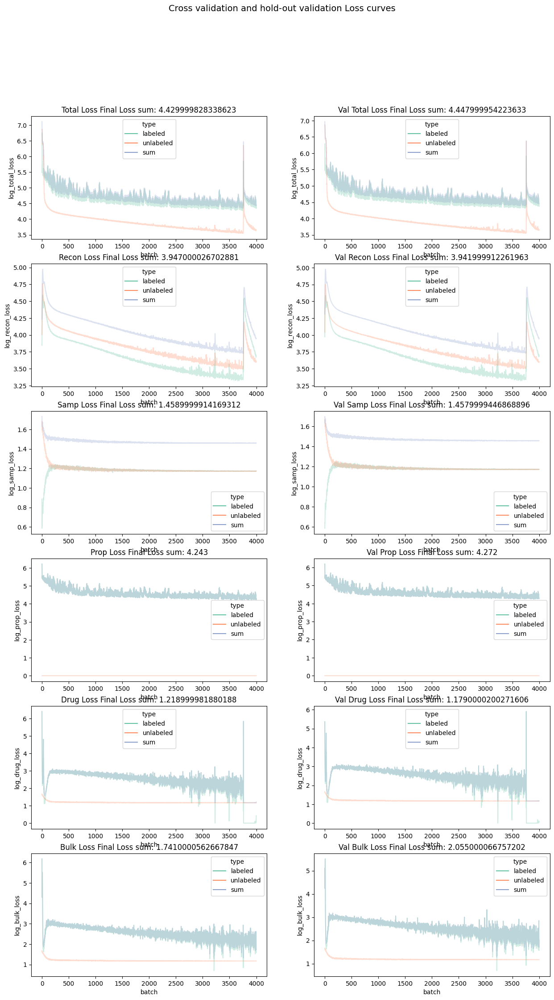

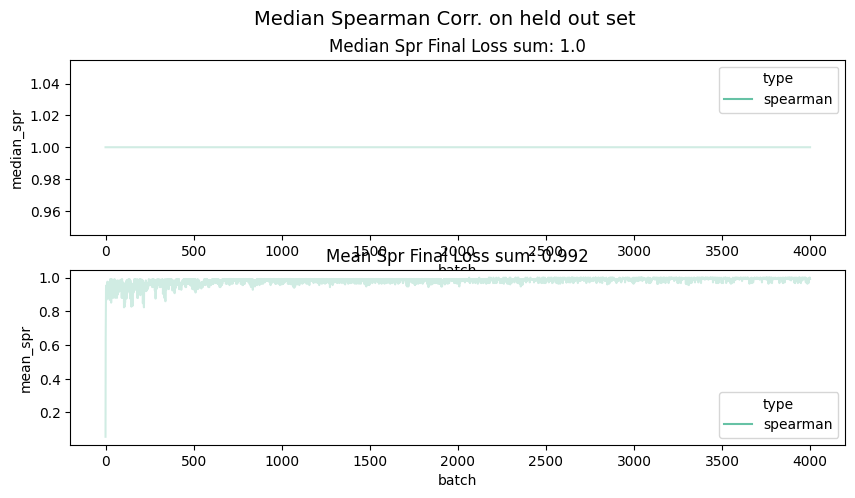

In [674]:
curr_n_epoch=200
curr_wt = 100

if True: # RETRAIN_MODELS

    params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
                alpha_rot=curr_wt*0.1, alpha_prop=curr_wt*100, 
                alpha_bulk=curr_wt*100, alpha_drug=curr_wt*100)

    ## model 1
    curr_res_id = f"trichostatin_model1_{res_id}"
    res1 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 2
    curr_res_id = f"trichostatin_model2_{res_id}"
    res2 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
                n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
                X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
                X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)

    ## model 3
    curr_res_id = f"trichostatin_model3_{res_id}"
    res3 = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=True, 
               n_tot_samples=n_tot_samples, n_drugs=n_drugs, n_tech=n_tech, 
               X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=drug_unkp, bulk_unkp=bulk_unkp,
               X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=drug_kp, bulk_kp=bulk_kp, params=params)


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model1_{res_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model1_{res_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model1_{res_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model1_{res_id}_classifier")


res2_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model2_{res_id}_encoder_unlab")
res2_enc_lab = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model2_{res_id}_encoder_lab")
res2_dec = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model2_{res_id}_decoder")
res2_classifier = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model2_{res_id}_classifier")


res3_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model3_{res_id}_encoder_unlab")
res3_enc_lab = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model3_{res_id}_encoder_lab")
res3_dec = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model3_{res_id}_decoder")
res3_classifier = tf.keras.models.load_model(f"{res_data_path}/trichostatin_model3_{res_id}_classifier")

## visualize latent spaces

### subset data

In [675]:
# subset the data to the training data
# to show our latent spaces are learning appropriately

idx_tmp_bulk = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type == "realistic"))[0]
idx_tmp_bulk = np.random.choice(idx_tmp_bulk, 5000, replace=True)


idx_tmp = np.where(np.logical_and(meta_df.isTraining == "Train", meta_df.cell_prop_type != "realistic"))[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)
idx_tmp = np.concatenate((idx_tmp, idx_tmp_bulk))

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]
perturb_temp = index_drug[perturb_temp]


bulk_temp =np.copy(Bulk_full)
bulk_temp = bulk_temp[idx_tmp]


### plot data

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-08-26 09:27:08.698858: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_8/add/z_samp_slack_8/add' id:60536 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_8/add/z_samp_slack_8/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_25/BiasAdd, tf_op_layer_z_samp_slack_8/mul/z_samp_slack_8/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-26 09:27:10.659113: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_o

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


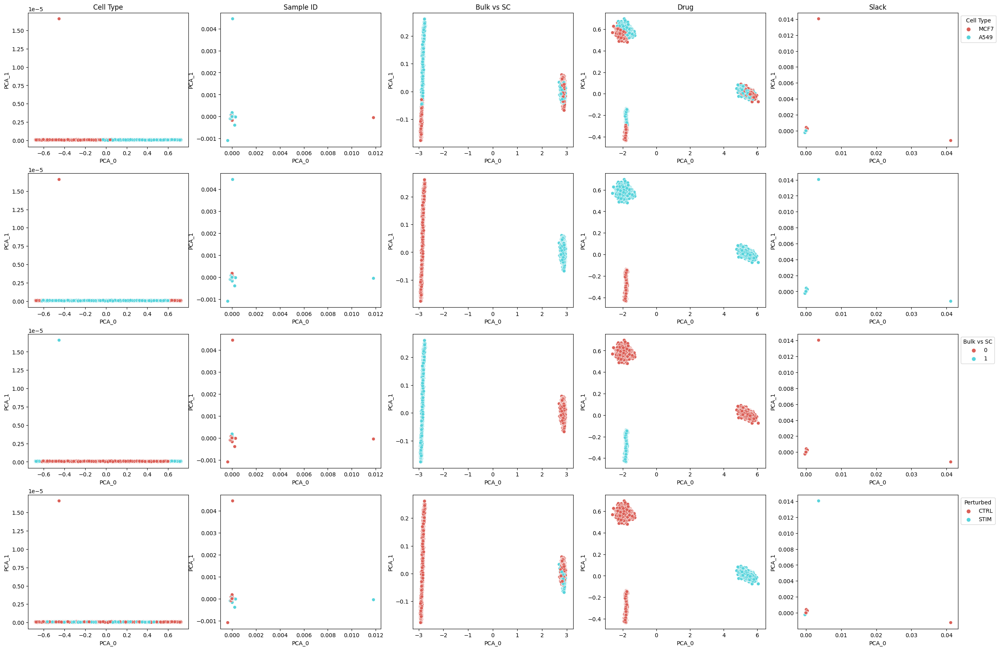

In [676]:

res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True, use_pca=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-08-26 09:27:17.276663: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_9/add/z_samp_slack_9/add' id:61463 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_9/add/z_samp_slack_9/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_27/BiasAdd, tf_op_layer_z_samp_slack_9/mul/z_samp_slack_9/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-26 09:27:19.264650: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_o

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


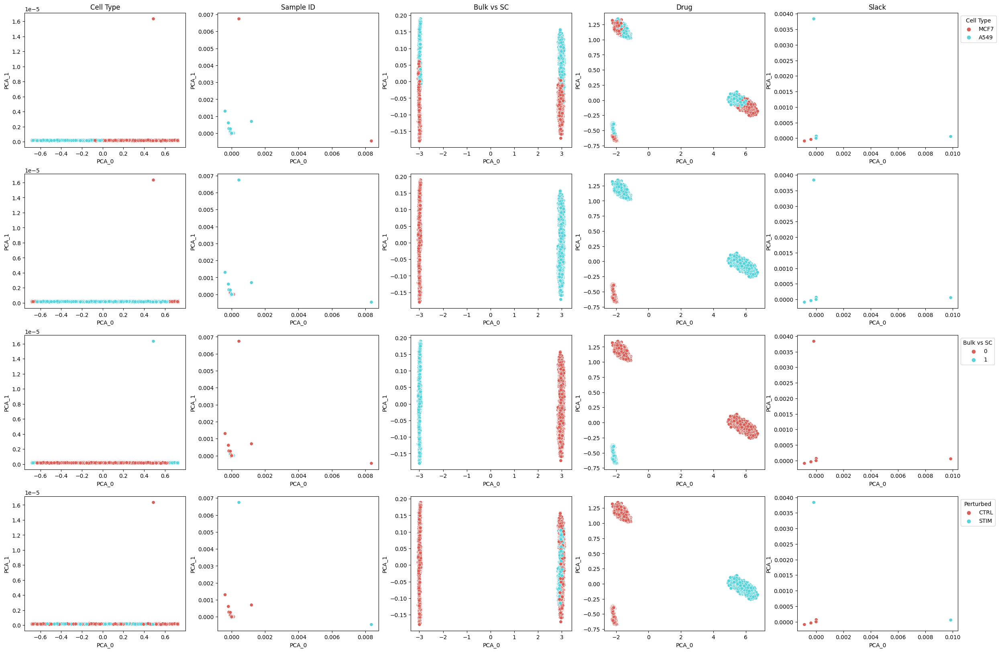

In [677]:

res2_latent_plot = buddi.plot_latent_spaces(res2_enc_unlab, res2_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-08-26 09:27:26.391237: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack_10/add/z_samp_slack_10/add' id:62390 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack_10/add/z_samp_slack_10/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_29/BiasAdd, tf_op_layer_z_samp_slack_10/mul/z_samp_slack_10/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-08-26 09:27:28.679578: W tensorflow/c/c_api.cc:304] Operation '{name:

(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


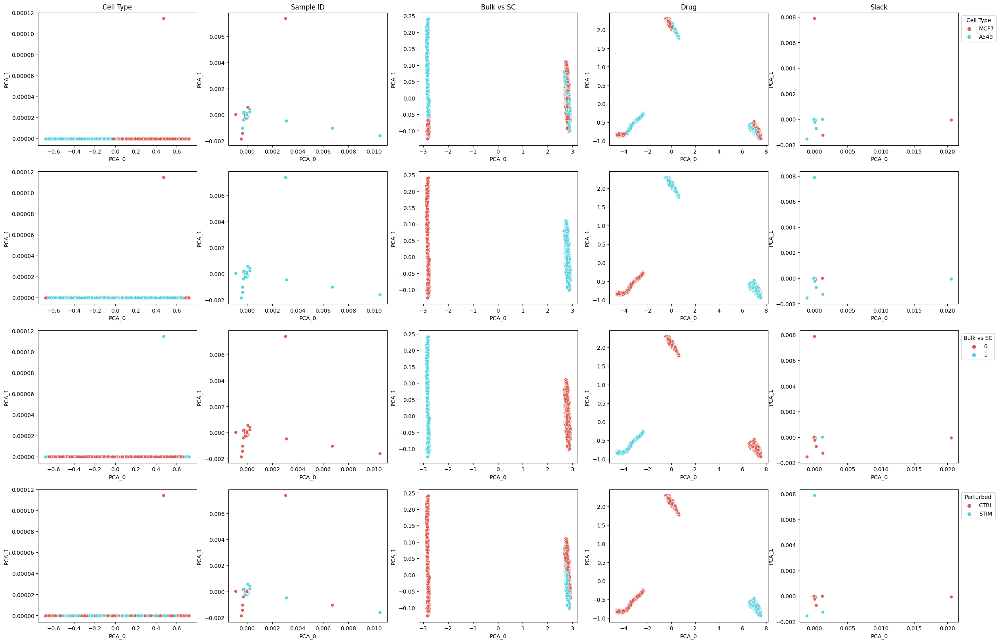

In [678]:

res3_latent_plot = buddi.plot_latent_spaces(res3_enc_unlab, res3_classifier,
                        X_temp, Y_temp, label_temp, perturb_temp, bulk_temp, 
                        batch_size=500, use_buddi4=True, hide_sample_ids=True)

## visualize reconstruction

### subset data

In [679]:
# take all training data

recon_idx = np.where(np.logical_and(meta_df.cell_prop_type != "realistic", meta_df.isTraining == "Train"))[0]
recon_idx = np.where(recon_idx)[0]
recon_idx = np.random.choice(recon_idx, 1000, replace=True)

# subset our data

meta_temp = meta_df.iloc[recon_idx]

X_temp = np.copy(X_full[recon_idx])

Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_full.columns[Y_temp]


label_temp = np.copy(Label_full[recon_idx])
label_temp = index_label[label_temp]

perturb_temp = Drug_full[recon_idx]




### plot data

In [680]:
Y_full.iloc[recon_idx]

,A549,MCF7
0,0.001795,0.998205
0,0.747600,0.252400
0,0.488600,0.511400
0,0.238000,0.762000
0,0.974046,0.025954
...,...,...
0,0.697000,0.303000
0,0.851800,0.148200
0,0.432200,0.567800
0,0.793800,0.206200


/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-08-26 09:27:35.568166: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_40/Sigmoid' id:61008 op device:{requested: '', assigned: ''} def:{{{node decoder_out_40/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_40/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


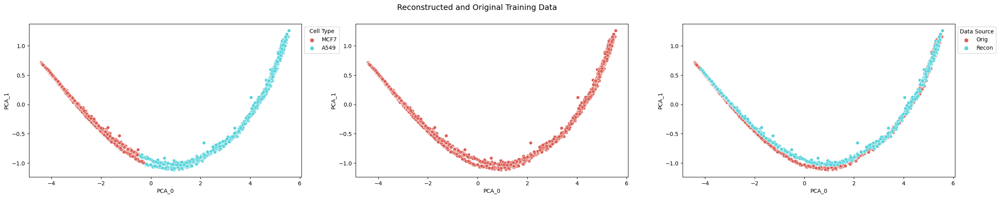

In [681]:
res1_recon_plot = buddi.plot_reconstruction_buddi(res1_enc_unlab, res1_classifier, res1_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-08-26 09:27:38.026115: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_41/Sigmoid' id:61935 op device:{requested: '', assigned: ''} def:{{{node decoder_out_41/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_41/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


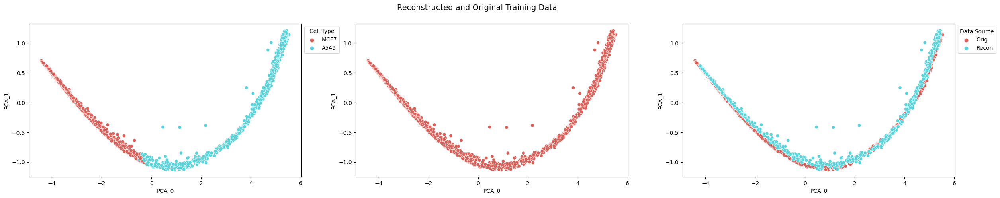

In [682]:
res2_recon_plot = buddi.plot_reconstruction_buddi(res2_enc_unlab, res2_classifier, res2_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)

/Users/davidnat/Documents/projects/greenelab/buddi_test/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-08-26 09:27:40.422928: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_42/Sigmoid' id:62862 op device:{requested: '', assigned: ''} def:{{{node decoder_out_42/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_42/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


(2000, 2)
(2000, 2)


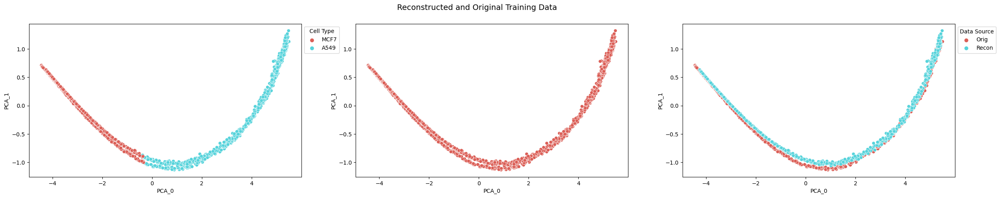

In [683]:
res3_recon_plot = buddi.plot_reconstruction_buddi(res3_enc_unlab, res3_classifier, res3_dec,
        X_temp, Y_temp, label_temp, perturb_temp, 
        batch_size=500, use_buddi4=True)